# **Stable Diffusion** 🎨
*using `🧨diffusers`*

This notebook is __closely__ oriented on [this notebook](https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/stable_diffusion.ipynb#scrollTo=BKiK67iTXQkt) and [the unidiffuser-pipeline-documentation](https://huggingface.co/docs/diffusers/api/pipelines/unidiffuser)

Stable Diffusion is a text-to-image latent diffusion model created by the researchers and engineers from [CompVis](https://github.com/CompVis), [Stability AI](https://stability.ai/) and [LAION](https://laion.ai/). It's trained on 512x512 images from a subset of the [LAION-5B](https://laion.ai/blog/laion-5b/) database. This model uses a frozen CLIP ViT-L/14 text encoder to condition the model on text prompts. With its 860M UNet and 123M text encoder, the model is relatively lightweight and can run on many consumer GPUs.
See the [model card](https://huggingface.co/CompVis/stable-diffusion) for more information.

### Setup

First, please make sure you are using a GPU runtime to run this notebook, so inference is much faster. If the following command fails, use the `Runtime` menu above and select `Change runtime type`.

In [ ]:
!nvidia-smi

Next, you should install `diffusers` as well `scipy`, `ftfy` and `transformers`. `accelerate` is used to achieve much faster loading.

In [ ]:
!pip install diffusers
!pip install transformers scipy ftfy accelerate

### Task 1 - Stable Diffusion Pipeline

`StableDiffusionPipeline` is an end-to-end inference pipeline that you can use to generate images from text with just a few lines of code.

First, we load the pre-trained weights of all components of the model. In this notebook we use Stable Diffusion version 1.4 ([CompVis/stable-diffusion-v1-4](https://huggingface.co/CompVis/stable-diffusion-v1-4)), but there are other variants that you may want to try:
* [runwayml/stable-diffusion-v1-5](https://huggingface.co/runwayml/stable-diffusion-v1-5)
* [stabilityai/stable-diffusion-2-1-base](https://huggingface.co/stabilityai/stable-diffusion-2-1-base)
* [stabilityai/stable-diffusion-2-1](https://huggingface.co/stabilityai/stable-diffusion-2-1). This version can produce images with a resolution of 768x768, while the others work at 512x512.

In addition to the model id [CompVis/stable-diffusion-v1-4](https://huggingface.co/CompVis/stable-diffusion-v1-4), we're also passing a specific `revision` and `torch_dtype` to the `from_pretrained` method.

We want to ensure that every free Google Colab can run Stable Diffusion, hence we're loading the weights from the half-precision branch [`fp16`](https://huggingface.co/CompVis/stable-diffusion-v1-4/tree/fp16) and also tell `diffusers` to expect the weights in float16 precision by passing `torch_dtype=torch.float16`.

If you want to ensure the highest possible precision, please make sure to remove `torch_dtype=torch.float16` at the cost of a higher memory usage.

In [15]:
import torch
from diffusers import StableDiffusionPipeline

pipe = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", torch_dtype=torch.float16)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Next, let's move the pipeline to GPU to have faster inference.

In [16]:
pipe = pipe.to("cuda")

And we are ready to generate images:

  0%|          | 0/50 [00:00<?, ?it/s]

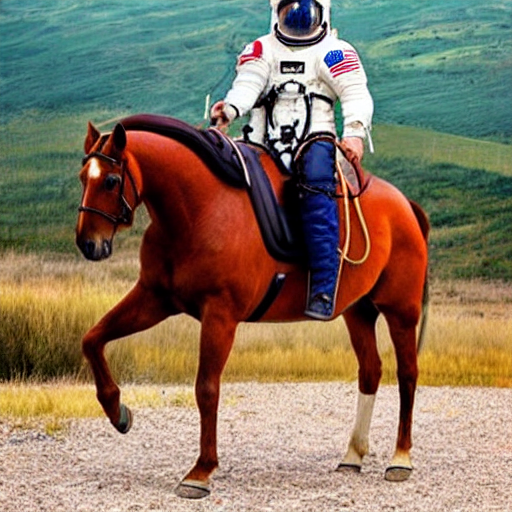

In [17]:
prompt = "a photograph of an astronaut riding a horse"
image = pipe(prompt).images[0]

image

Running the above cell multiple times will give you a different image every time. If you want deterministic output you can pass a random seed to the pipeline. Every time you use the same seed you'll have the same image result.

  0%|          | 0/50 [00:00<?, ?it/s]

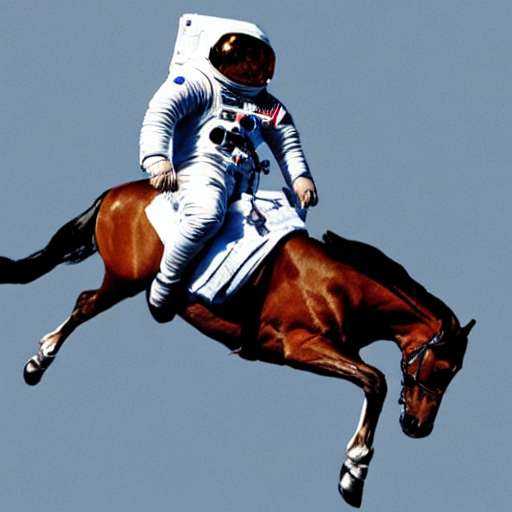

In [18]:
import torch

generator = torch.Generator("cuda").manual_seed(1024)

image = pipe(prompt, generator=generator).images[0]

image

#### 📝 Task

Now it's your turn!
Try to work on the following task:

Test out a SD-model!

Use this same colab-Notebook to test out Stable Diffusion using the huggingface `diffusers`-module and generate some images.

1. Print out the model architecture and try to map the components of the model to the description above.

2. Generate some images using different prompts, guidance_scales and seeds. What do you observe?

3. There are _many_ pages with tips on how to "correctly" prompt SD-models to improve their performance. Find one and test the described tips out. What do you find?

4. Test the `num_inference_steps`-parameter. How does it affect the quality of the generated image?

1.

In [19]:
pipe = StableDiffusionPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4", torch_dtype=torch.float16
)
pipe = pipe.to("cuda")

# Print pipeline components
print(pipe)

# More detailed:
print("VAE:", pipe.vae)
print("UNet:", pipe.unet)
print("Text encoder:", pipe.text_encoder)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

StableDiffusionPipeline {
  "_class_name": "StableDiffusionPipeline",
  "_diffusers_version": "0.35.2",
  "_name_or_path": "CompVis/stable-diffusion-v1-4",
  "feature_extractor": [
    "transformers",
    "CLIPImageProcessor"
  ],
  "image_encoder": [
    null,
    null
  ],
  "requires_safety_checker": true,
  "safety_checker": [
    "stable_diffusion",
    "StableDiffusionSafetyChecker"
  ],
  "scheduler": [
    "diffusers",
    "PNDMScheduler"
  ],
  "text_encoder": [
    "transformers",
    "CLIPTextModel"
  ],
  "tokenizer": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

VAE: AutoencoderKL(
  (encoder): Encoder(
    (conv_in): Conv2d(3, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (down_blocks): ModuleList(
      (0): DownEncoderBlock2D(
        (resnets): ModuleList(
          (0-1): 2 x ResnetBlock2D(
            (norm1): GroupNorm(32, 128, eps=1e-06

UNet2DConditionModel -> Denoiser

2.

  0%|          | 0/50 [00:00<?, ?it/s]

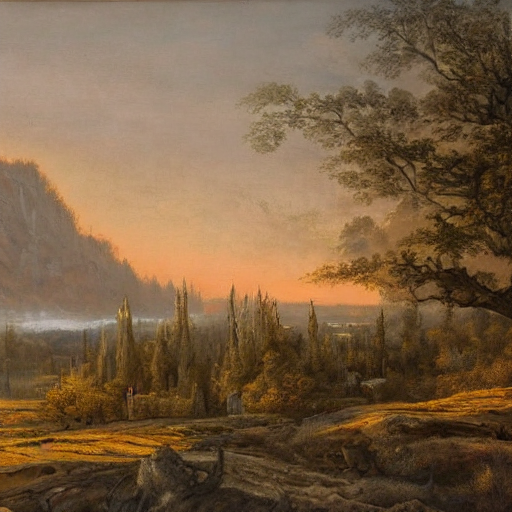

Prompt: a fantasy landscape, castle on a hill, sunset, Seed: 42, Guidance: 3.0


  0%|          | 0/50 [00:00<?, ?it/s]

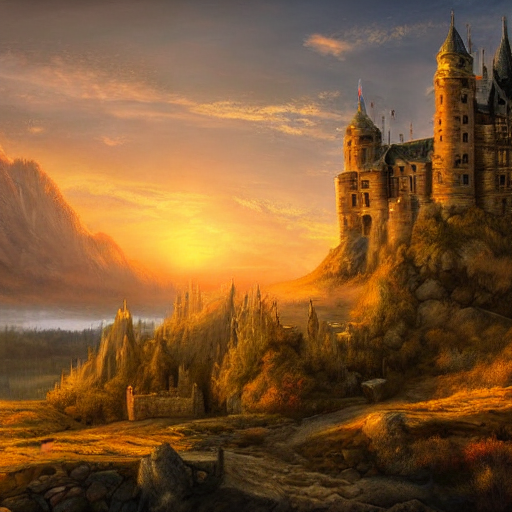

Prompt: a fantasy landscape, castle on a hill, sunset, Seed: 42, Guidance: 7.5


  0%|          | 0/50 [00:00<?, ?it/s]

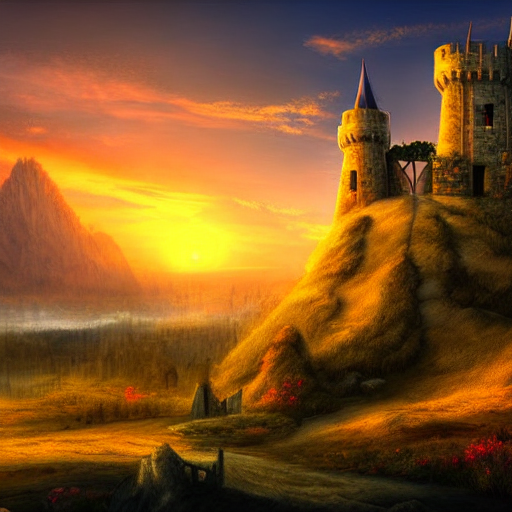

Prompt: a fantasy landscape, castle on a hill, sunset, Seed: 42, Guidance: 15.0


  0%|          | 0/50 [00:00<?, ?it/s]

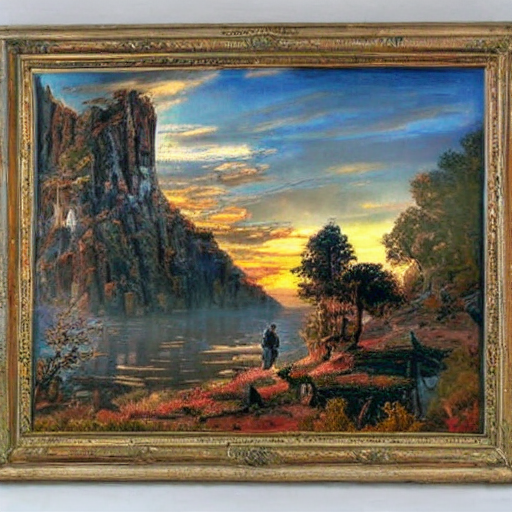

Prompt: a fantasy landscape, castle on a hill, sunset, Seed: 1234, Guidance: 3.0


  0%|          | 0/50 [00:00<?, ?it/s]

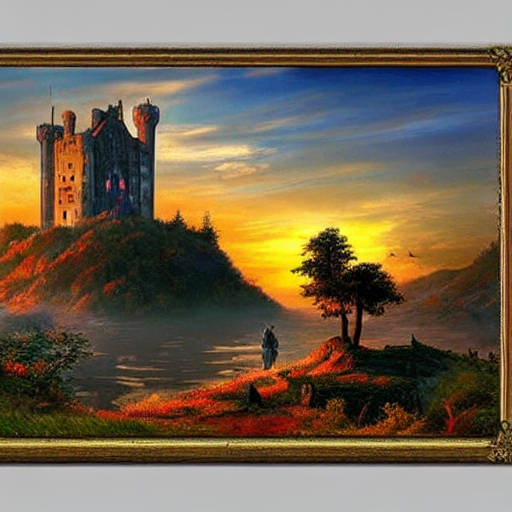

Prompt: a fantasy landscape, castle on a hill, sunset, Seed: 1234, Guidance: 7.5


  0%|          | 0/50 [00:00<?, ?it/s]

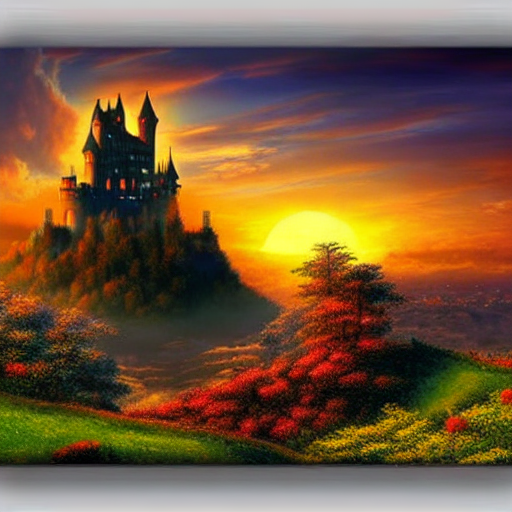

Prompt: a fantasy landscape, castle on a hill, sunset, Seed: 1234, Guidance: 15.0


  0%|          | 0/50 [00:00<?, ?it/s]

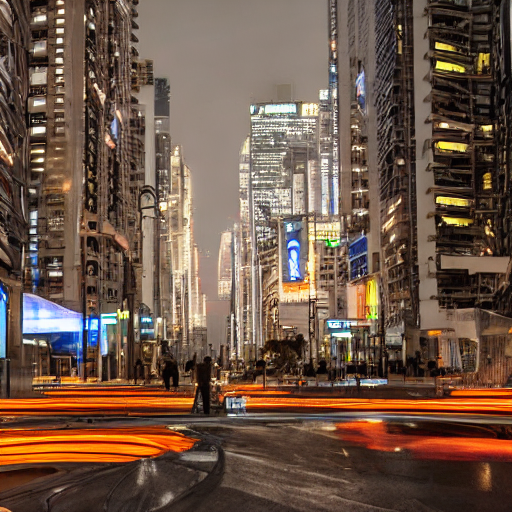

Prompt: a photo of a futuristic city at night, neon lights, Seed: 42, Guidance: 3.0


  0%|          | 0/50 [00:00<?, ?it/s]

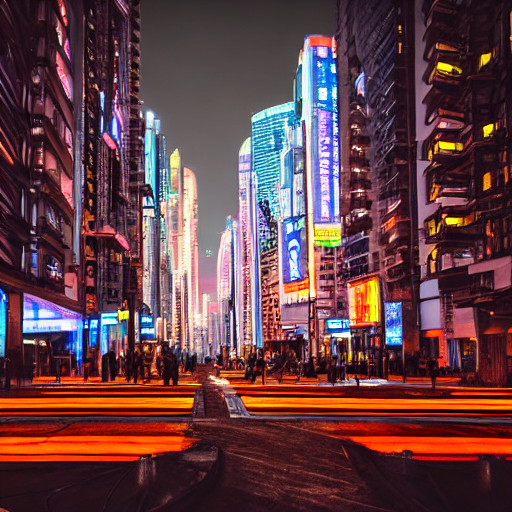

Prompt: a photo of a futuristic city at night, neon lights, Seed: 42, Guidance: 7.5


  0%|          | 0/50 [00:00<?, ?it/s]

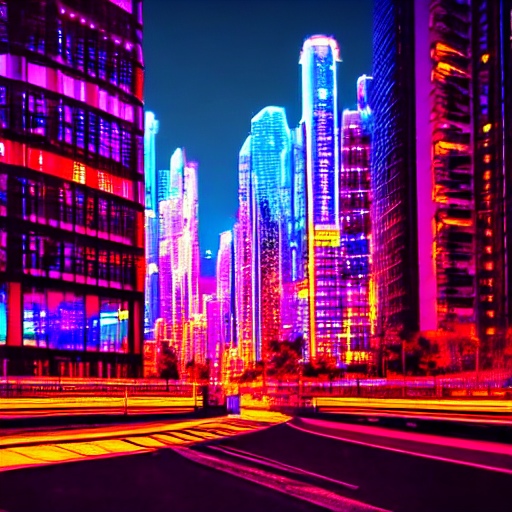

Prompt: a photo of a futuristic city at night, neon lights, Seed: 42, Guidance: 15.0


  0%|          | 0/50 [00:00<?, ?it/s]

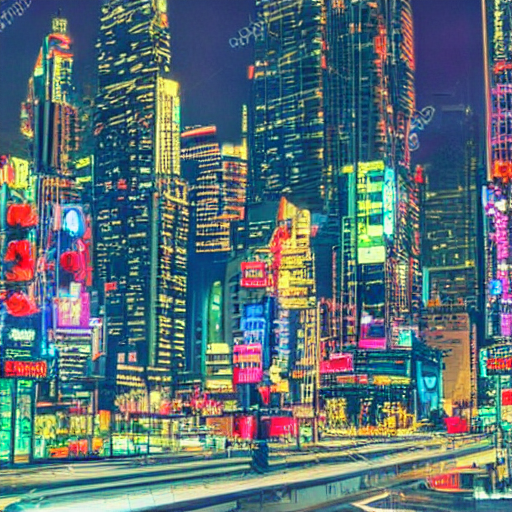

Prompt: a photo of a futuristic city at night, neon lights, Seed: 1234, Guidance: 3.0


  0%|          | 0/50 [00:00<?, ?it/s]

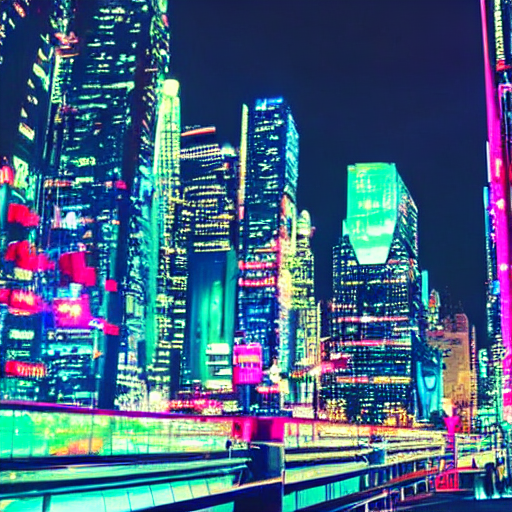

Prompt: a photo of a futuristic city at night, neon lights, Seed: 1234, Guidance: 7.5


  0%|          | 0/50 [00:00<?, ?it/s]

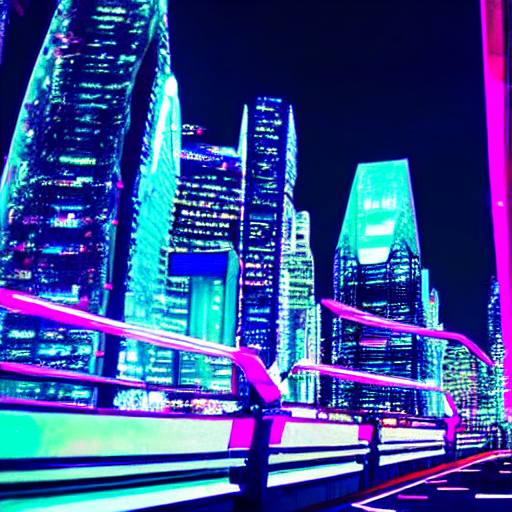

Prompt: a photo of a futuristic city at night, neon lights, Seed: 1234, Guidance: 15.0


In [20]:
prompts = [
    "a fantasy landscape, castle on a hill, sunset",
    "a photo of a futuristic city at night, neon lights",
]

seeds = [42, 1234]
guidance_scales = [3.0, 7.5, 15.0]

generator = torch.Generator(device="cuda")

for prompt in prompts:
    for seed in seeds:
        for scale in guidance_scales:
            generator.manual_seed(seed)
            image = pipe(
                prompt,
                guidance_scale=scale,
                num_inference_steps=50,
                generator=generator
            ).images[0]
            display(image)  # or save to file
            print(f"Prompt: {prompt}, Seed: {seed}, Guidance: {scale}")

3. https://www.klicktipp.com/de/support/wissensdatenbank/prompting-leitfaden/
- Be specific and concrete
- Give context or style
- Use adjectives that define mood or material

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

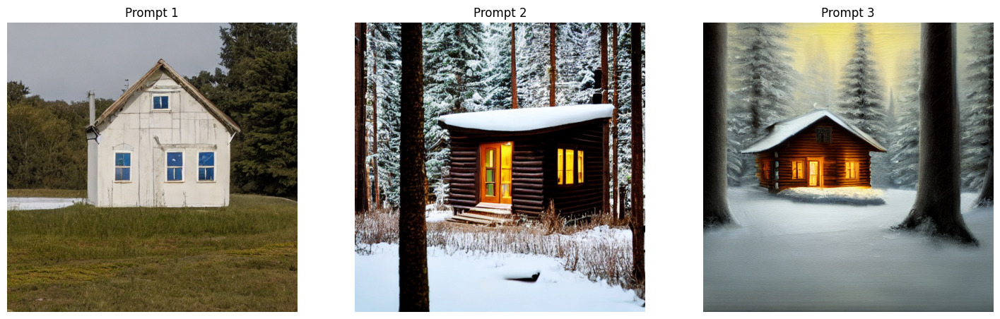


Prompts used:
1: a house
2: a small wooden cabin in a snowy forest, warm light glowing from the window
3: a small wooden cabin in a snowy forest, warm light glowing from the window, oil painting, cinematic lighting, moody atmosphere


In [22]:
import matplotlib.pyplot as plt
prompts = [
    "a house",
    "a small wooden cabin in a snowy forest, warm light glowing from the window",
    "a small wooden cabin in a snowy forest, warm light glowing from the window, oil painting, cinematic lighting, moody atmosphere"
]

seed = 42
guidance = 7.5
steps = 50

generator = torch.Generator("cuda").manual_seed(seed)

# generate images
images = []
for p in prompts:
    img = pipe(
        p,
        num_inference_steps=steps,
        guidance_scale=guidance,
        generator=generator
    ).images[0]
    images.append(img)

# images side-by-side
plt.figure(figsize=(18, 6))
for i, (prompt, img) in enumerate(zip(prompts, images)):
    plt.subplot(1, 3, i+1)
    plt.imshow(img)
    plt.title(f"Prompt {i+1}")
    plt.axis("off")

plt.show()

print("\nPrompts used:")
for i, p in enumerate(prompts):
    print(f"{i+1}: {p}")

4.

  0%|          | 0/10 [00:00<?, ?it/s]

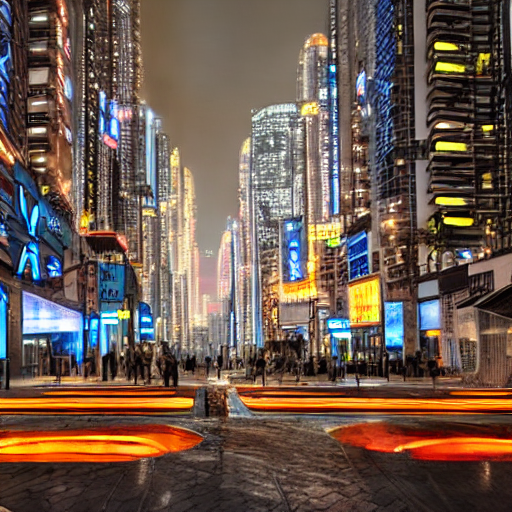

Steps: 10


  0%|          | 0/25 [00:00<?, ?it/s]

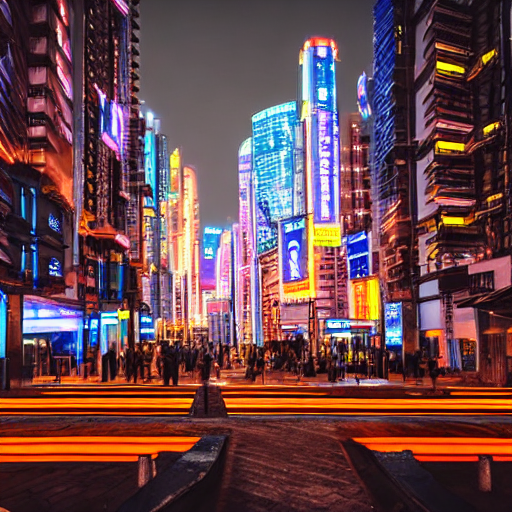

Steps: 25


  0%|          | 0/50 [00:00<?, ?it/s]

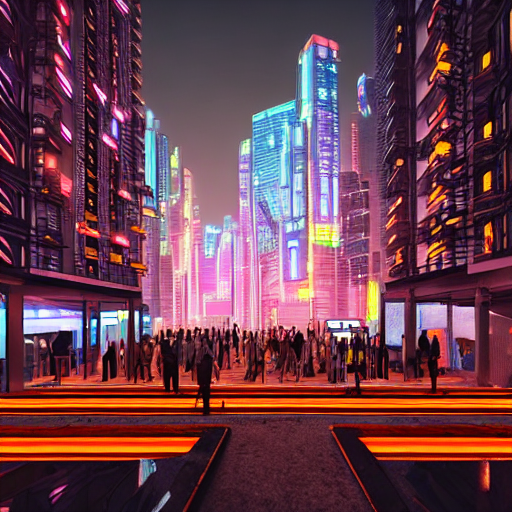

Steps: 50


  0%|          | 0/100 [00:00<?, ?it/s]

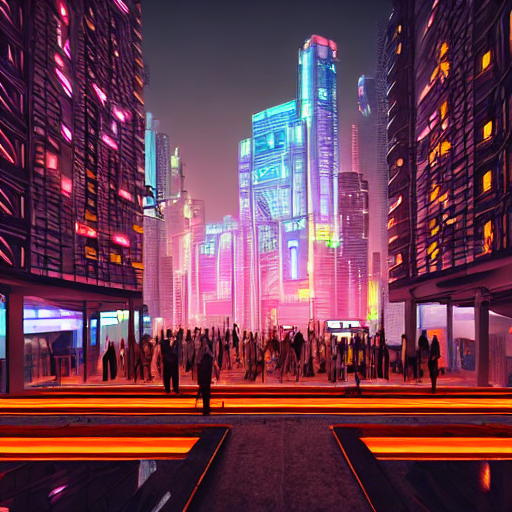

Steps: 100


In [21]:
for steps in [10, 25, 50, 100]:
    generator.manual_seed(42)
    image = pipe(
        "a futuristic city at night, neon lights",
        guidance_scale=7.5,
        num_inference_steps=steps,
        generator=generator
    ).images[0]
    display(image)
    print("Steps:", steps)

### Task 2 - UniDiffuser

UniDiffuser is a unified diffusion model that can be used for both text-to-image and image-to-image generation. It is based on Stable Diffusion, but with some modifications to make it more versatile. In this notebook we use the version [thu-ml/unidiffuser-v1](https://huggingface.co/thu-ml/unidiffuser-v1).

In [ ]:
from diffusers import UniDiffuserPipeline

device = "cuda"
model_id_or_path = "thu-ml/unidiffuser-v1"
pipe = UniDiffuserPipeline.from_pretrained(model_id_or_path, torch_dtype=torch.float16)
pipe.to(device)

Since the UniDiffuser-Model is trained on a combined latent space, the model can be used to jointly sample a image - text - pair:

In [ ]:
sample = pipe(num_inference_steps=20, guidance_scale=8.0)
image = sample.images[0]
text = sample.text[0]
print(text)

In [ ]:
image

Alternatively, you can sample from the image-distribution conditioned on a text-prompt:

In [ ]:
prompt = "an elephant under the sea"

sample = pipe(prompt=prompt, num_inference_steps=20, guidance_scale=8.0)
t2i_image = sample.images[0]

t2i_image


This can also be done in reverse:

In [ ]:
sample = pipe(image=t2i_image, num_inference_steps=20, guidance_scale=8.0)
i2t_text = sample.text[0]
print(i2t_text)

#### 📝 Task

Now it's your turn!

Try to solve the following task using the UniDiffuser-Pipeline:

Generate some images and text.

Try the tips you tested on the basic SD-model and test whether the model accurately generates descriptions for your generated images.

Present your results of both tasks to the course and upload your adapted notebook to moodle.